In [3]:
import numpy as np
import skfda
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import animation
from IPython.display import HTML
import json

# Open and load the JSON file, I have renamed it.
with open("GSW.json", "r") as file:
    data = json.load(file)


print(type(data))    

<class 'dict'>


## Data cleaning

In [33]:
def extract_positions(data, evento):
    posiciones = []
    
    if evento >= len(data['events']):  
        print(f"Error: evento {evento} is out of range.")
        return pd.DataFrame()  

    for momento in range(len(data['events'][evento]['moments'])):
        moment_data = data['events'][evento]['moments'][momento]

        if len(moment_data) <= 5 or not moment_data[5]:  
            print(f"Warning: Moment {momento} in evento {evento} has no tracking data.")
            continue  


        extracted_data = list(zip(*moment_data[5]))

        if len(extracted_data) < 5:  
            print(f"Error: Unexpected data format in evento {evento}, momento {momento}")
            continue  
            
        

        posiciones.append(pd.DataFrame({
            'Team_id': extracted_data[0],
            'Player_id': extracted_data[1],
            'x': extracted_data[2],
            'y': extracted_data[3],
            'z': extracted_data[4]
        }))

    if not posiciones:
        print(f"No valid positions found for evento {evento}.")
        return pd.DataFrame(columns=['Team_id', 'Player_id', 'x', 'y', 'z'])

    posiciones = pd.concat(posiciones, ignore_index=True)
    
    return posiciones

In [11]:
len(data['events'])

486

In [35]:
total=[]
for i in range(len(data['events'])):
    datos=extract_positions(data,i)
    Pelota=datos[datos['Team_id']==-1][['x','y','z']].to_numpy()
    total.append(Pelota)
    
    
    

No valid positions found for evento 8.
No valid positions found for evento 34.
No valid positions found for evento 59.
No valid positions found for evento 83.
No valid positions found for evento 84.
No valid positions found for evento 85.
No valid positions found for evento 86.
No valid positions found for evento 119.
No valid positions found for evento 122.
No valid positions found for evento 131.
No valid positions found for evento 153.
No valid positions found for evento 172.
No valid positions found for evento 202.
No valid positions found for evento 228.
No valid positions found for evento 229.
No valid positions found for evento 230.
No valid positions found for evento 258.
No valid positions found for evento 300.
No valid positions found for evento 360.
No valid positions found for evento 361.
No valid positions found for evento 362.
No valid positions found for evento 381.
No valid positions found for evento 382.
No valid positions found for evento 420.
No valid positions found

In [37]:
len(total) #Notar que los añadimos vacíos

486

In [39]:
total[8]

array([], shape=(0, 3), dtype=object)

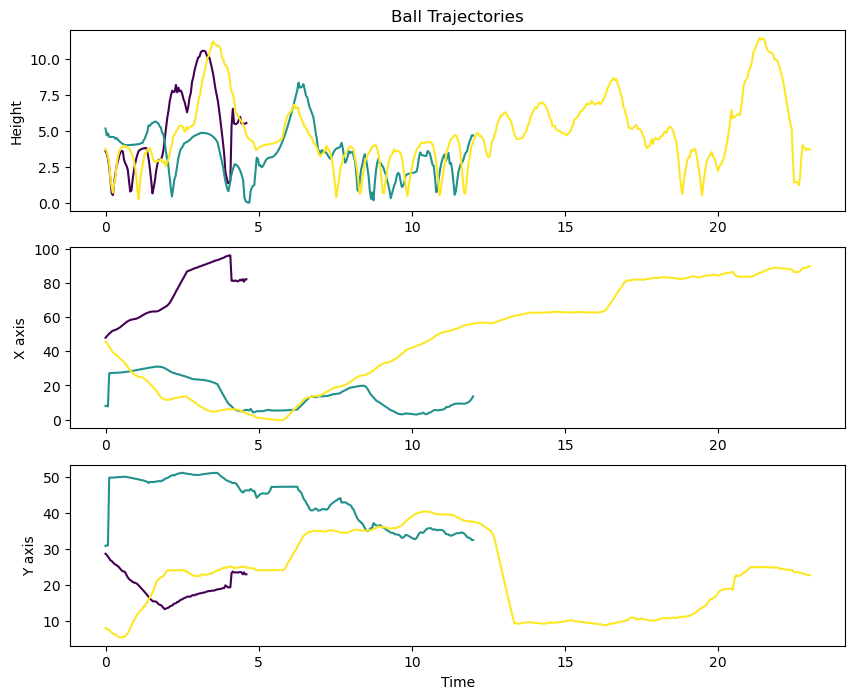

In [1358]:
import matplotlib.cm as cm
fig, axs = plt.subplots(3, 1, figsize=(10, 8))
colors=cm.viridis(np.linspace(0,1,3))
axs[0].plot(np.linspace(0,len(total[14])*0.04,len(total[14])),total[14][:,2],color=colors[0])
axs[0].plot(np.linspace(0,len(total[50])*0.04,len(total[50])),total[50][:,2],color=colors[1])
axs[0].plot(np.linspace(0,len(total[180])*0.04,len(total[180])),total[180][:,2],color=colors[2])
axs[0].set_title('Ball Trajectories')
axs[0].set_ylabel('Height')
axs[1].plot(np.linspace(0,len(total[14])*0.04,len(total[14])),total[14][:,0],color=colors[0])
axs[1].plot(np.linspace(0,len(total[50])*0.04,len(total[50])),total[50][:,0],color=colors[1])
axs[1].plot(np.linspace(0,len(total[180])*0.04,len(total[180])),total[180][:,0],color=colors[2])
axs[1].set_ylabel('X axis')
axs[2].plot(np.linspace(0,len(total[14])*0.04,len(total[14])),total[14][:,1],color=colors[0])
axs[2].plot(np.linspace(0,len(total[50])*0.04,len(total[50])),total[50][:,1],color=colors[1])
axs[2].plot(np.linspace(0,len(total[180])*0.04,len(total[180])),total[180][:,1],color=colors[2])
axs[2].set_ylabel('Y axis')
axs[2].set_xlabel('Time')
plt.savefig('fig1.png')
plt.show()

In [70]:
acotados=[pelota for pelota in total if len(pelota)>400]
llenos=[pelota[:400] for pelota in acotados]

In [158]:
import skfda
grid_points=np.linspace(0,400*0.04,400)
fd=skfda.FDataGrid(llenos,grid_points=grid_points)
altura=[arr[:,2] for arr in llenos]
hfd=skfda.FDataGrid(altura,grid_points=grid_points)
media=skfda.exploratory.stats.mean(fd)
media=media.data_matrix

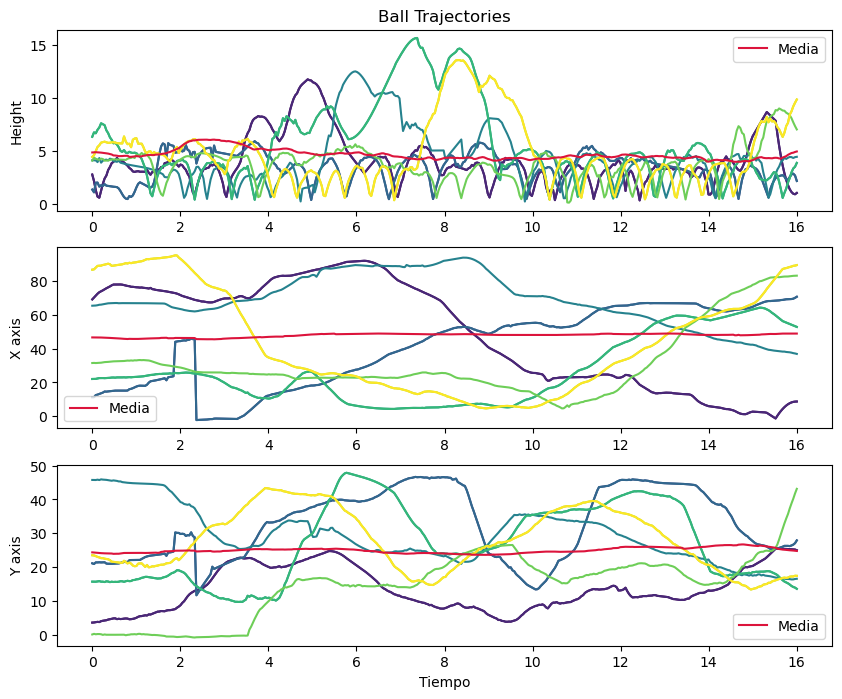

In [256]:
fig, axs = plt.subplots(3, 1, figsize=(10, 8))
axs[0].set_title('Ball Trajectories')
axs[0].set_ylabel('Height')
axs[1].set_ylabel('X axis')
axs[2].set_ylabel('Y axis')
axs[2].set_xlabel('Tiempo')
colors=cm.viridis(np.linspace(0,1,10))
for i in range(10):
    axs[0].plot(grid_points,llenos[i][:,2],color=colors[i])

    axs[1].plot(grid_points,llenos[i][:,0],color=colors[i])

    axs[2].plot(grid_points,llenos[i][:,1],color=colors[i])


axs[0].plot(grid_points,media[0][:,2],color='crimson',label='Media')
axs[1].plot(grid_points,media[0][:,0],color='crimson',label='Media')
axs[2].plot(grid_points,media[0][:,1],color='crimson',label='Media')
axs[0].legend()
axs[1].legend()
axs[2].legend()
plt.savefig('fig2.png')
plt.show()


## Break down trajectories in between bounces

In [273]:
from scipy.signal import find_peaks
def Partir(Pelota):
    minima,_= find_peaks(-Pelota[:,2])
    Pelota_low=[]
    Particion=[]
    grid=[]
    grid_a_partir=np.linspace(0,len(Pelota)*0.04,len(Pelota))
    for a,i in enumerate(minima):
        if Pelota[i][2]<=1.5:
            Pelota_low.append(i)
    for i in range(len(Pelota_low)):
        if Pelota_low[i]<max(Pelota_low):
            Particion.append(Pelota[Pelota_low[i]:Pelota_low[i+1]])
            grid.append(grid_a_partir[Pelota_low[i]:Pelota_low[i+1]])
        else:
            Particion.append(Pelota[Pelota_low[i]:len(Pelota)])
            grid.append(grid_a_partir[Pelota_low[i]:len(Pelota)])
    return Particion,grid

In [280]:
Part_1,grid_1=Partir(total[14])
Part_2,grid_2=Partir(total[50])
Part_3,grid_3=Partir(total[180])

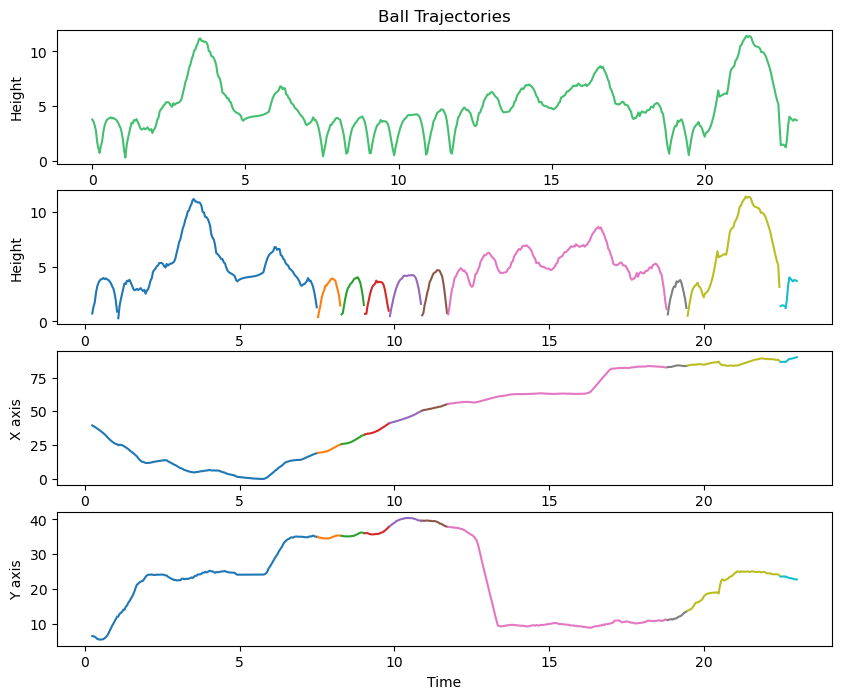

In [316]:
fig, axs = plt.subplots(4, 1, figsize=(10, 8))
colors=cm.tab10(np.linspace(0,1,len(Part_3)))
axs[0].plot(np.linspace(0,len(total[180][:,2])*0.04,len(total[180][:,2])),total[180][:,2],color=cm.viridis(0.7))
for i in range(len(Part_3)):
    axs[2].plot(grid_3[i],Part_3[i][:,0],color=colors[i])
    axs[3].plot(grid_3[i],Part_3[i][:,1],color=colors[i])
    axs[1].plot(grid_3[i],Part_3[i][:,2],color=colors[i])

axs[0].set_ylabel('Height')
axs[0].set_title('Ball Trajectories')
axs[1].set_ylabel('Height')
axs[2].set_ylabel('X axis')
axs[3].set_ylabel('Y axis')
axs[3].set_xlabel('Time')
plt.savefig('fig3.png')
plt.show()

In [376]:
depth = skfda.exploratory.depth.ModifiedBandDepth()
posoutlier=depth(hfd)
outlier=np.argmin(posoutlier)
median=np.argmax(posoutlier)

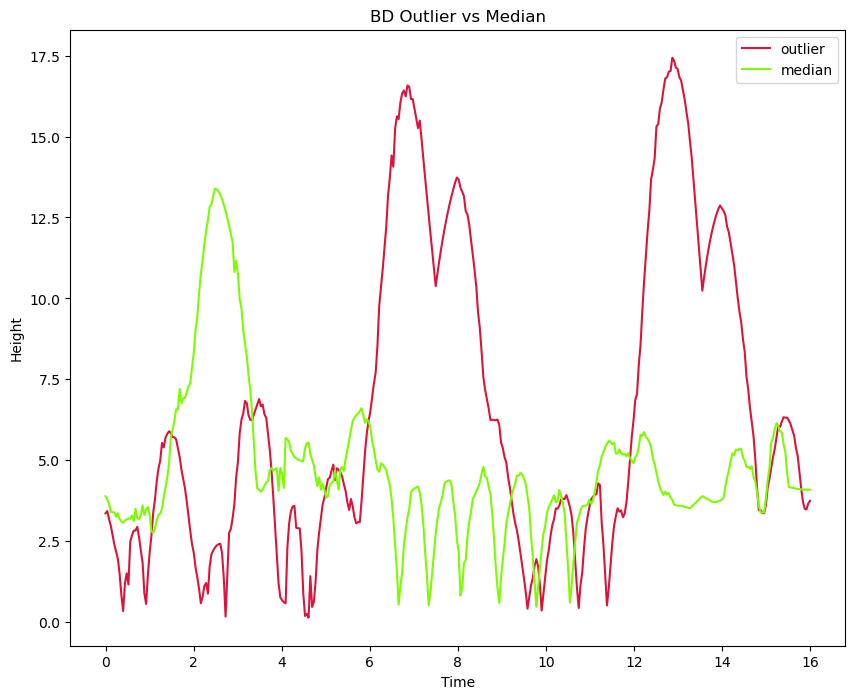

In [385]:
plt.figure(figsize=(10,8))
plt.plot(grid_points,altura[outlier], color='crimson',label='outlier')
plt.plot(grid_points,altura[median],color='lawngreen',label='median')
plt.title('BD Outlier vs Median')
plt.xlabel('Time')
plt.ylabel('Height')
plt.legend()
plt.savefig('fig4.png')
plt.show()

In [420]:
indposoutlier=list(enumerate(posoutlier))
orden=sorted(indposoutlier,key =lambda x:x[1]) # PROBLEMA! tenemos muchas repetidas.
orden

[(142, 0.24868647381132952),
 (143, 0.24868647381132952),
 (195, 0.2551626407891159),
 (96, 0.25567487026792235),
 (97, 0.25567487026792235),
 (98, 0.25567487026792235),
 (99, 0.26534148732436424),
 (100, 0.26534148732436424),
 (26, 0.27750717198332564),
 (27, 0.27750717198332564),
 (51, 0.28728249708162995),
 (52, 0.28728249708162995),
 (261, 0.28865660649042457),
 (262, 0.28865660649042457),
 (197, 0.29368505843452325),
 (198, 0.29368505843452325),
 (199, 0.29368505843452325),
 (123, 0.2955399469860806),
 (124, 0.2955399469860806),
 (263, 0.29586238552541194),
 (264, 0.29586238552541194),
 (32, 0.29736392128686734),
 (33, 0.29736392128686734),
 (34, 0.29736392128686734),
 (138, 0.29822304819560735),
 (139, 0.29822304819560735),
 (204, 0.2998088386925444),
 (66, 0.3002981393574665),
 (5, 0.3025774510874121),
 (6, 0.3025774510874121),
 (265, 0.3034467356952404),
 (266, 0.3034467356952404),
 (207, 0.30691994283454693),
 (208, 0.30691994283454693),
 (76, 0.3071917045628697),
 (77, 0.3071

In [430]:
norepe=[orden[i] for i in range(len(orden)-1) if orden[i][1]!=orden[i+1][1]]
norepe.append(orden[-1])
norepe #Esto solucionaría el problema, aunque a nosotros nos da igual. Bueno, podemos hacer un boxplot

[(143, 0.24868647381132952),
 (195, 0.2551626407891159),
 (98, 0.25567487026792235),
 (100, 0.26534148732436424),
 (27, 0.27750717198332564),
 (52, 0.28728249708162995),
 (262, 0.28865660649042457),
 (199, 0.29368505843452325),
 (124, 0.2955399469860806),
 (264, 0.29586238552541194),
 (34, 0.29736392128686734),
 (139, 0.29822304819560735),
 (204, 0.2998088386925444),
 (66, 0.3002981393574665),
 (6, 0.3025774510874121),
 (266, 0.3034467356952404),
 (208, 0.30691994283454693),
 (78, 0.3071917045628697),
 (203, 0.30757403387884696),
 (95, 0.3076596679170632),
 (200, 0.31011894235647053),
 (243, 0.3102094402516995),
 (185, 0.31125658231744624),
 (106, 0.3121587300693827),
 (103, 0.31381017425965557),
 (210, 0.31417096523292665),
 (174, 0.3152482062530908),
 (125, 0.3164775167958308),
 (91, 0.3169823974390134),
 (92, 0.3169908296136277),
 (115, 0.3180979015455721),
 (137, 0.31843743897143817),
 (191, 0.31928787124714897),
 (4, 0.31980985636108844),
 (167, 0.32018435101416276),
 (25, 0.32093

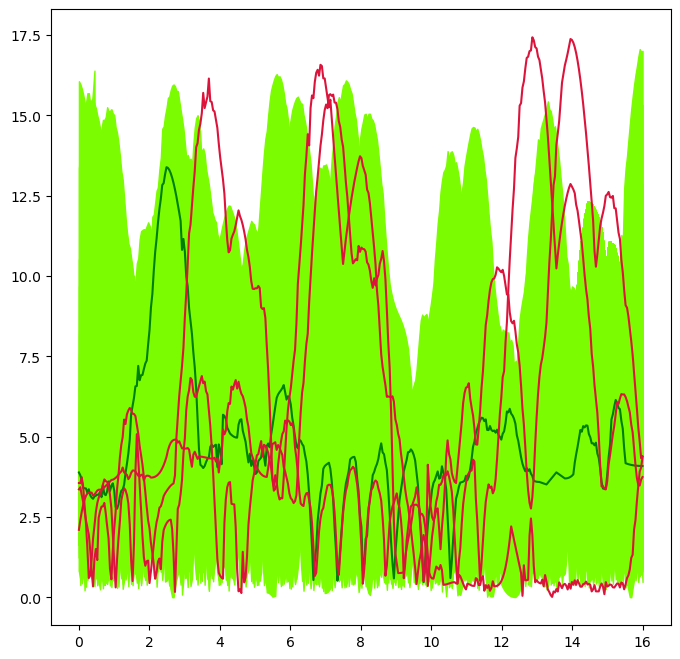

In [491]:
medio=norepe[len(norepe)//2]
plt.figure(figsize=(8,8))
for i in range(len(norepe)//2):    
    plt.fill_between(grid_points,altura[medio[0]],altura[norepe[len(norepe)-i-1][0]],color='lawngreen')
plt.plot(grid_points,altura[median],color='green')
plt.plot(grid_points,altura[norepe[0][0]],color='crimson')
plt.plot(grid_points,altura[norepe[1][0]],color='crimson') #Las tres menos profundas # Mi idea de un Boxplot
plt.plot(grid_points,altura[norepe[2][0]],color='crimson')
plt.show()

## My sample

In [395]:
import pickle #Lista de 9 listas con los arrays
with open('Muestra_Clasificada3.pkl', 'rb') as file:
    MuestraPerfecta = pickle.load(file)

In [404]:
sum(len(MuestraPerfecta[i]) for i in range(9))

51

In [1612]:
def Clasi(Pelota):
    Particion,grid=Partir(Pelota)
    Clases=[[] for _ in range(9)]
    Jugada=[]
    Colors=[]
    for i in range(len(Particion)):
        if max(Particion[i][:,2])>10:
            if max(Particion[i][:,2])>15:
                Clases[3].append(Particion[i])
                Jugada.append('Three')
                Colors.append('crimson')
            else:
                meridio=np.argmax(Particion[i][:,2])
                if np.sqrt((Particion[i][meridio][0]-5.25)**2+ (Particion[i][meridio][1]-25)**2)<np.sqrt(16) or np.sqrt((Particion[i][meridio][0]-89.75)**2+ (Particion[i][meridio][1]-25)**2)<np.sqrt(16):
                    Clases[5].append(Particion[i])
                    Jugada.append('Layup')
                    Colors.append('orange')
                else:
                    Clases[4].append(Particion[i])
                    Jugada.append('Mid Range')
                    Colors.append('yellow')
                
        else:
            if len(Particion[i][:,2])>=35:
                if len(Particion[i][:,2])>60:
                    Clases[8].append(Particion[i])
                    Jugada.append('Ball Movement')
                    Colors.append('cyan')
                    
                else:
                    Clases[0].append(Particion[i])
                    Jugada.append('Pass')
                    Colors.append('lawngreen')
            else:
                Clases[7].append(Particion[i])
                Jugada.append('Dribble')
                Colors.append('blue')
    return Clases,Jugada,Colors

In [714]:
def Reconstruc(Pelota):
    Particion,grid=Partir(Pelota)
    Clases,Jugada,Colors=Clasi(Pelota)
    plt.figure(figsize=(10,5))
    for i in range(len(Jugada)):
        plt.plot(grid[i],Particion[i][:,2],color=Colors[i],label=Jugada[i])
    plt.legend()

    plt.show()


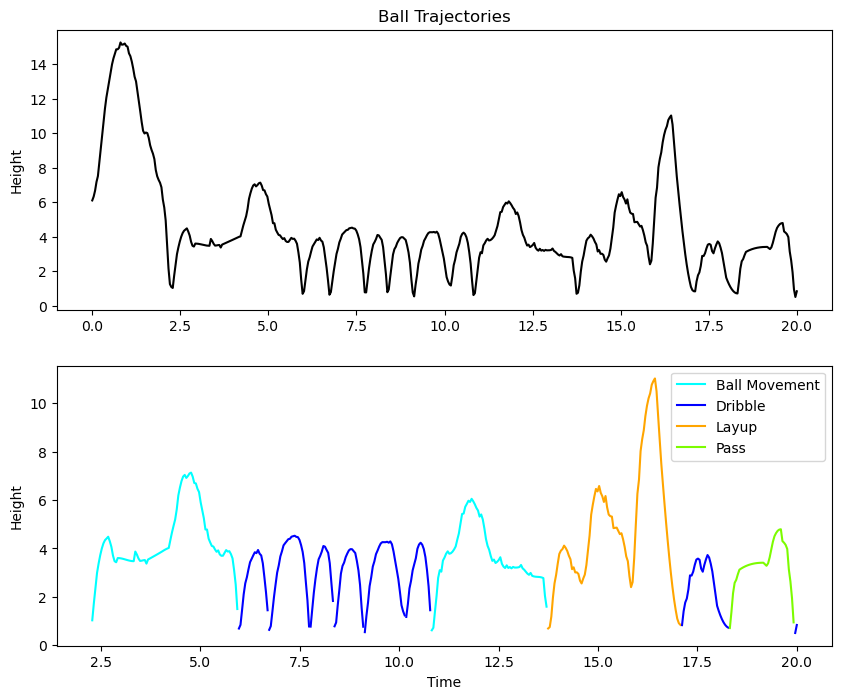

In [1630]:
Particion,grid=Partir(total[146])
Clases,Jugada,Colors=Clasi(total[146])
fig, axs = plt.subplots(2, 1, figsize=(10, 8))
axs[0].plot(np.linspace(0,len(total[146])*0.04,len(total[146])),total[146][:,2],color='black')
for i in range(len(Jugada)):
    axs[1].plot(grid[i],Particion[i][:,2],color=Colors[i],label=Jugada[i])
handles, labels = axs[1].get_legend_handles_labels()
by_label = dict(zip(labels, handles))
axs[1].legend(by_label.values(), by_label.keys())
axs[0].set_ylabel('Height')
axs[0].set_title('Ball Trajectories')
axs[1].set_ylabel('Height')
axs[1].set_xlabel('Time')
plt.savefig('fig5.png')
plt.show()

## Intro to DTW

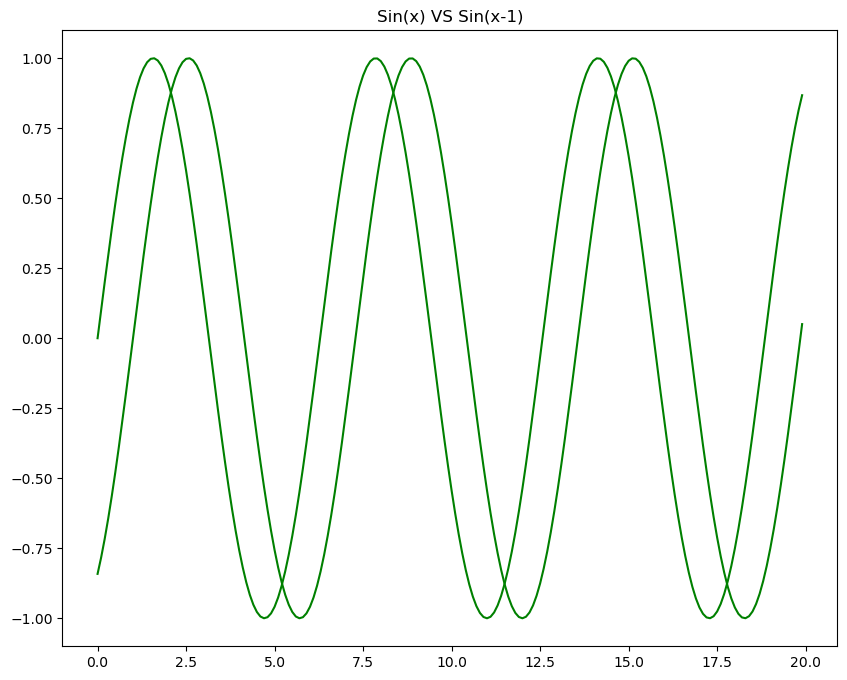

In [746]:
x = np.arange(0, 20, .1)
s1 = np.sin(x)
s2 = np.sin(x - 1)
plt.figure(figsize=(10,8))
plt.plot(x,s1,color='green')
plt.plot(x,s2,color='green')
plt.title('Sin(x) VS Sin(x-1)')
plt.savefig('sin')
plt.show()

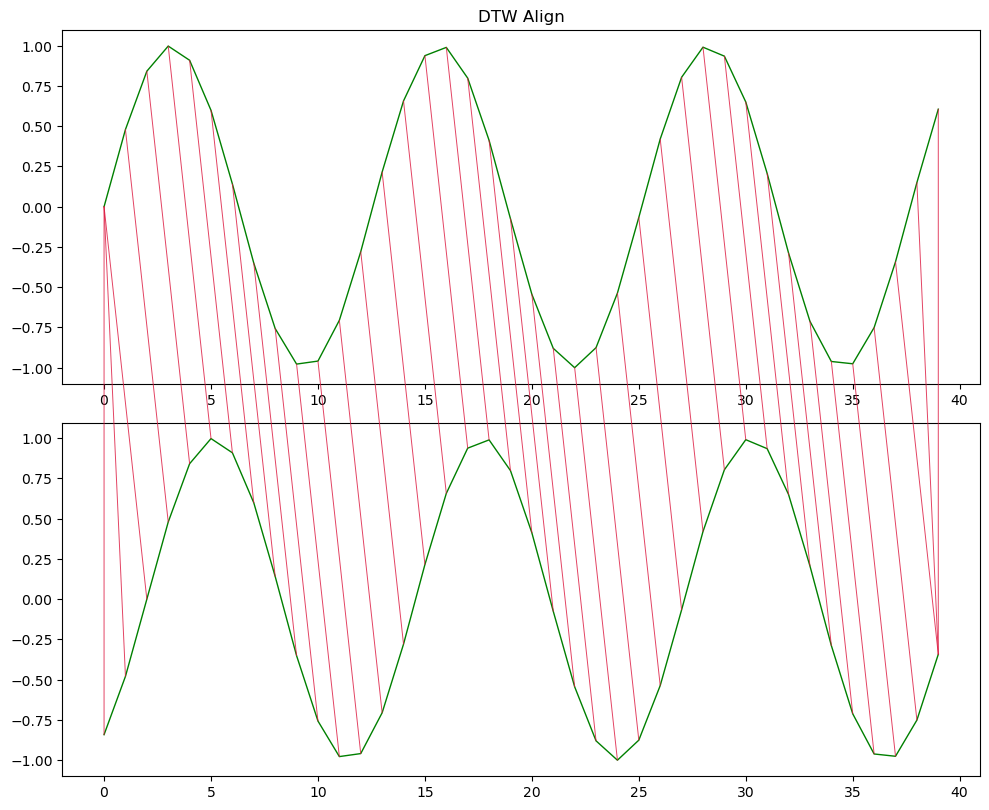

In [1217]:
fig,axs= plt.subplots(2,1,figsize=(10, 8))
x = np.arange(0, 20, .5) # notar que tomamos menos puntos para que sea visible
s1 = np.sin(x)
s2 = np.sin(x - 1)
path = dtw.warping_path(s1,s2)
dtwvis.plot_warping(s1, s2, path,series_line_options={'linewidth': 1, 'color': 'green', 'alpha': 1},warping_line_options={'linewidth': 0.7, 'color': 'crimson', 'alpha': 0.8},fig=fig,axs=axs)
axs[0].set_title('DTW Align')
plt.savefig('fig6')
plt.show()

<Figure size 1000x800 with 0 Axes>

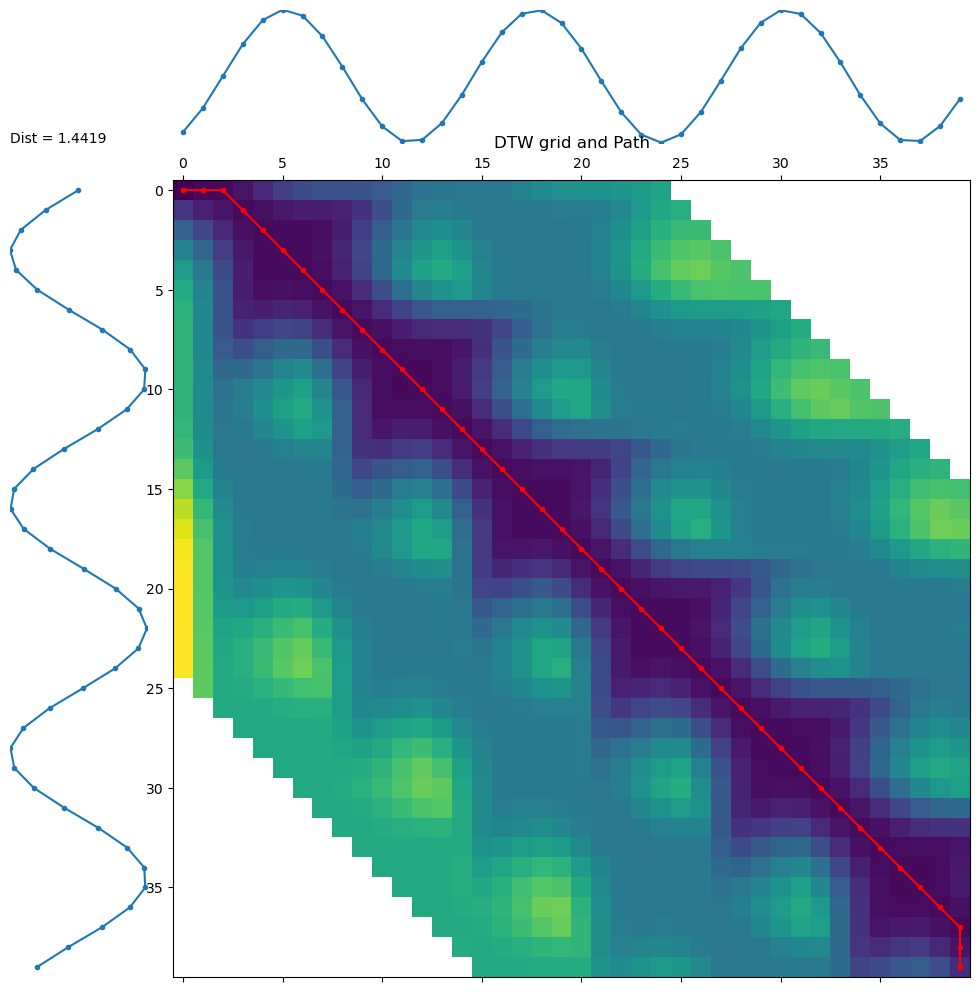

In [1219]:
plt.figure(figsize=(10,8))
d, paths = dtw.warping_paths(s1, s2, window=25, psi=0)
best_path = dtw.best_path(paths)
dtwvis.plot_warpingpaths(s1,s2,paths, best_path)
plt.title('DTW grid and Path')
plt.savefig('fig7')
plt.show()

In [501]:
masivo=[]
for i in range(len(total)):
    add,grid=Partir(total[i]) #todas las rotas
    masivo.append(add)
masivo=[arr for tray in masivo for arr in tray] #Teníamos listas de listas de arrays, pasamos a una sola lista con todas las partes de todas las tray

In [503]:
len(masivo)

5598

In [507]:
m_altura=[arr[:,2] for arr in masivo]

In [530]:
AlturasPerfectas=[[arr[:,2] for arr in clase] for clase in MuestraPerfecta]

In [536]:
from dtaidistance import dtw_barycenter
prueba=dtw_barycenter.dba_loop(AlturasPerfectas[3])

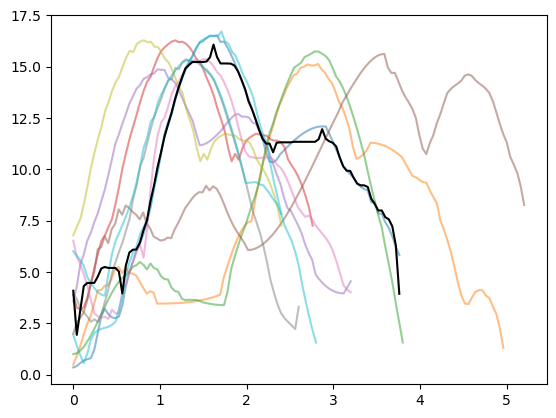

In [796]:

colors=cm.tab10(np.linspace(0,1,len(AlturasPerfectas[3])))
for i in range(len(AlturasPerfectas[3])):
    plt.plot(np.linspace(0,len(AlturasPerfectas[3][i])*0.04,len(AlturasPerfectas[3][i])),AlturasPerfectas[3][i],color=colors[i],alpha=0.5)
plt.plot(np.linspace(0,len(prueba)*0.04,len(prueba)),prueba,color='crimson')

### Be careful with DBA and the initial selection

In [1424]:
prueba1=[0,5,1,5,1,5,0]
prueba2=[0,2,1,2,1,2,0]
inicial=[0,0.5,0,0.5,0,0.5,0]

ayiyi=dtw_barycenter.dba([prueba1,prueba2],inicial)

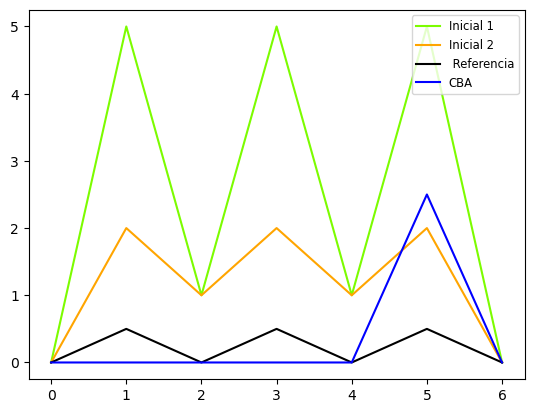

In [1430]:
plt.plot(prueba1,color='lawngreen',label='Inicial 1')
plt.plot(prueba2,color='orange', label='Inicial 2')
plt.plot(inicial,color='black', label=' Referencia')
plt.plot(ayiyi,color='blue', label='CBA')
plt.legend(fontsize='small')
plt.savefig('fig8.png')

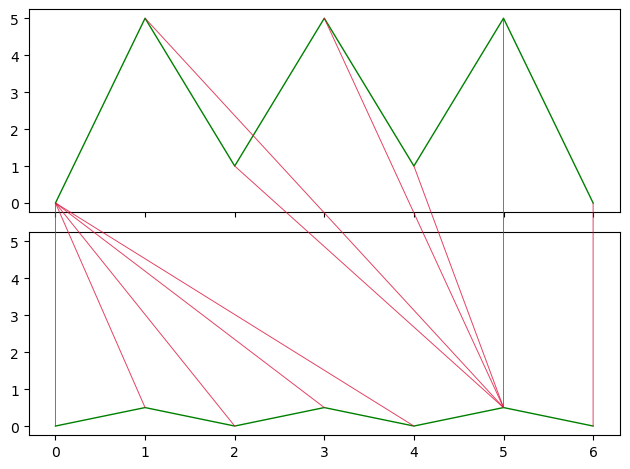

In [1400]:
path = dtw.warping_path(prueba1,inicial)
dtwvis.plot_warping(prueba1, inicial, path,series_line_options={'linewidth': 1, 'color': 'green', 'alpha': 1},warping_line_options={'linewidth': 0.7, 'color': 'crimson', 'alpha': 0.8})
plt.savefig('fig20.png')

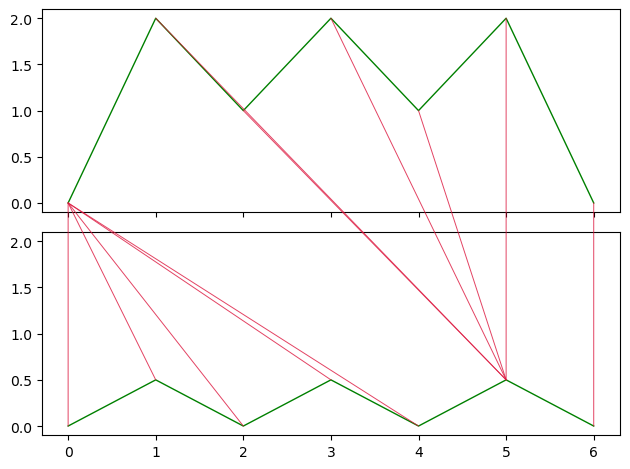

In [1402]:
path = dtw.warping_path(prueba2,inicial)
dtwvis.plot_warping(prueba2, inicial, path,series_line_options={'linewidth': 1, 'color': 'green', 'alpha': 1},warping_line_options={'linewidth': 0.7, 'color': 'crimson', 'alpha': 0.8})
plt.savefig('fig21.png')

(<Figure size 1000x1000 with 4 Axes>, [<Axes: >, <Axes: >, <Axes: >, <Axes: >])

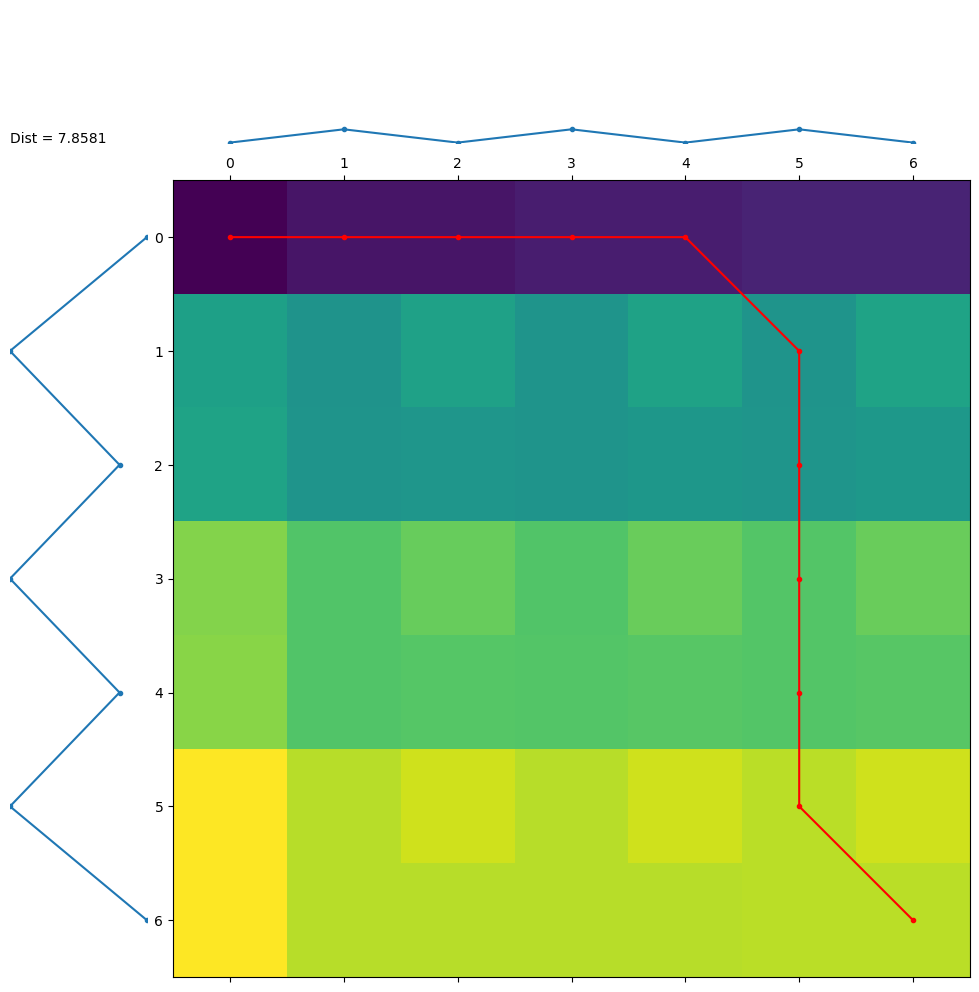

In [1213]:
s1=np.array([0,5,1,5,1,5,0]) # HACE FALTA QUE SEAN ARRAYS
s2=np.array([0,2,1,2,1,2,0])
inicial=np.array([0,0.5,0,0.5,0,0.5,0])
d, paths = dtw.warping_paths(s1, inicial, window=25, psi=0) #el psi es el numero de puntos que se puede saltar para empezar.
best_path = dtw.best_path(paths)
dtwvis.plot_warpingpaths(s1,inicial,paths, best_path)

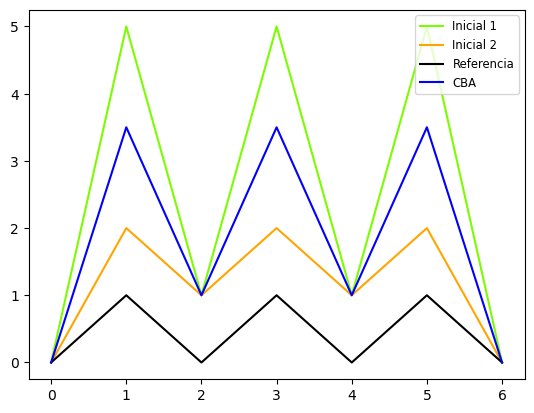

In [1440]:
prueba1=[0,5,1,5,1,5,0]
prueba2=[0,2,1,2,1,2,0]
inicial=[0,1,0,1,0,1,0]

ayiyi=dtw_barycenter.dba_loop([prueba1,prueba2],inicial)
plt.plot(prueba1,color='lawngreen',label='Inicial 1')
plt.plot(prueba2,color='orange', label='Inicial 2')
plt.plot(inicial,color='black', label='Referencia')
plt.plot(ayiyi,color='blue', label='CBA')
plt.legend(fontsize='small')
plt.savefig('fig9.png')

## Intuitive Classifier
#### Take minimum distance to the class.

In [1412]:
def ClasiDWT(Pelota):
    distan=[]
    tickers=['Pase','Alley','Post','Three','Mid Range','Layup','F.T','Dribble','Ball Movement']
    for i in range(9):
        
        if not MuestraPerfecta[i]:
            distan.append(20000) # Cutrez para que no me molesten las clases que todavía no he trabajado en ellas
        else:
            
            haus=[]
            for j in range(len(MuestraPerfecta[i])):
                haus.append(dtw.distance(Pelota,MuestraPerfecta[i][j][:,2]))
            distan.append(np.mean(haus))

    return Pelota,tickers[np.argmin(distan)],distan

In [1414]:
ClasiDWT(MuestraPerfecta[3][0][:,2])

(array([ 0.35089,  0.42118,  0.56591,  0.68587,  0.75317,  0.80128,
         1.22033,  2.04328,  2.8472 ,  3.20916,  2.94632,  2.79662,
         2.74913,  2.82205,  3.37645,  4.3288 ,  4.98951,  5.51162,
         6.03533,  6.37246,  6.83646,  7.44181,  8.17275,  9.12029,
         9.83501, 10.77435, 11.68938, 12.28642, 12.74941, 13.4328 ,
        14.0025 , 14.40776, 14.91038, 15.25268, 15.52665, 15.90265,
        16.17275, 16.24253, 16.40404, 16.51556, 16.50264, 16.53051,
        16.20496, 16.22786, 15.93928, 15.5893 , 15.20346, 14.78756,
        14.34736, 13.88868, 13.41728, 12.93896, 12.4595 , 11.9847 ,
        11.49401, 10.81536, 10.37665, 10.35436, 10.46145, 10.73427,
        10.91317, 11.0864 , 11.25207, 11.40831, 11.55322, 11.68493,
        11.80154, 11.90118, 11.98196, 12.04199, 12.07939, 12.09228,
        12.08932, 11.74454, 11.37218, 10.96733, 10.59124, 10.16089,
         9.93626,  9.76629,  9.58798,  9.32153,  9.14987,  9.04111,
         8.97433,  8.39228,  8.40303,  7.85933, 

In [1416]:
Centros=[[] for i in range(9)]
for i in range(9):
        if not AlturasPerfectas[i]:
            Centros[i].append(0)
        else:
            Centros[i].append(dtw_barycenter.dba_loop(AlturasPerfectas[i])) # NO PONEMOS INICIAL, SELECCIONA LA PRIMERA
            

In [1418]:
def ClasiDBA(Pelota): #REQUIERE LOS CENTROS YA HECHOS
    distan=[]
    labels=[0,1,2,3,4,5,6,7,8]
    tickers=['Pase','Alley','Post','Three','Mid Range','Layup','F.T','Dribble','Ball Movement']
    for i in range(9):
        
        if not MuestraPerfecta[i]:
            distan.append(20000) # Cutrez para que no me molesten las clases que todavía no he trabajado en ellas
        else:
            distan.append(dtw.distance(Pelota,Centros[i][0]))
    clase=tickers[np.argmin(distan)]
    return labels[np.argmin(distan)],clase,distan

In [1038]:
ClasiDBA(AlturasPerfectas[3][0])

(3,
 'Three',
 [38.12233548884475,
  20000,
  20000,
  5.573693113209862,
  9.314085992727453,
  19.662855828833337,
  20000,
  67.23335544196486,
  44.98045403459673])

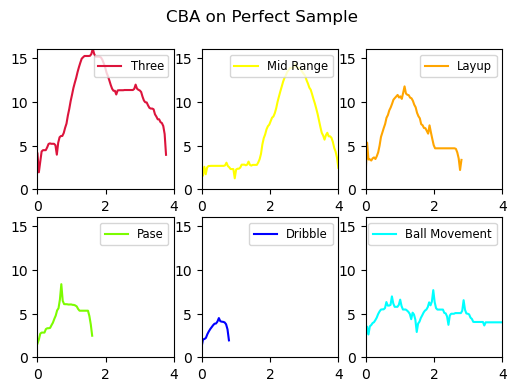

In [1420]:
fig, axs= plt.subplots(2,3, figsize=(6,4))
colors=['lawngreen','black','black','crimson','yellow','orange','black','blue','cyan']
tickers=['Pase','Alley','Post','Three','Mid Range','Layup','F.T','Dribble','Ball Movement']
axs[0,0].plot(np.linspace(0,len(Centros[3][0])*0.04,len(Centros[3][0])),Centros[3][0],color=colors[3],label=tickers[3])
axs[0,1].plot(np.linspace(0,len(Centros[4][0])*0.04,len(Centros[4][0])),Centros[4][0],color=colors[4],label=tickers[4])
axs[0,2].plot(np.linspace(0,len(Centros[5][0])*0.04,len(Centros[5][0])),Centros[5][0],color=colors[5],label=tickers[5])
axs[1,0].plot(np.linspace(0,len(Centros[0][0])*0.04,len(Centros[0][0])),Centros[0][0],color=colors[0],label=tickers[0])
axs[1,1].plot(np.linspace(0,len(Centros[7][0])*0.04,len(Centros[7][0])),Centros[7][0],color=colors[7],label=tickers[7])
axs[1,2].plot(np.linspace(0,len(Centros[8][0])*0.04,len(Centros[8][0])),Centros[8][0],color=colors[8],label=tickers[8])

for ax in axs.flat:
    ax.set_xlim(0, 4) 
    ax.set_ylim(0, 16)
    ax.legend(loc='upper right',fontsize='small')
plt.suptitle('CBA on Perfect Sample')
plt.savefig('fig10.png')
plt.show()
    

In [1259]:
def media_rara(Muestra): #Muestra con las z solo, esto es la media aritmética pero usando toda la infomracion que hay disponible, notar el tema del las longitudes.
    medias=[[] for _ in range(9)]
    for i in range(9):
        if not Muestra[i]:
            print('Vacío')
        else:
            maximum=np.max([len(Muestra[i][j]) for j in range(len(Muestra[i]))])
            nans=np.full((len(Muestra[i]),maximum),np.nan)
            for j,tocho in enumerate(Muestra[i]):
                nans[j,:len(tocho)]=tocho
            media=np.nanmean(nans,axis=0)
            medias[i].append(media)
    return medias

In [1261]:
mediaspochas=media_rara(AlturasPerfectas)

Vacío
Vacío
Vacío


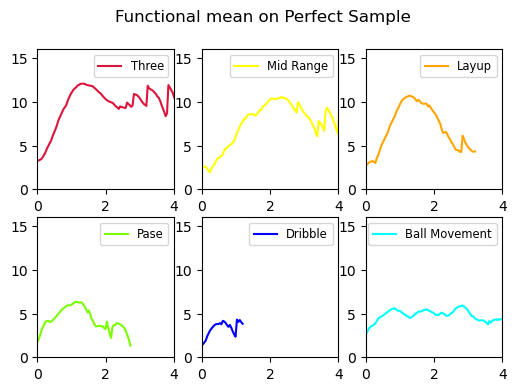

In [1422]:
fig, axs= plt.subplots(2,3, figsize=(6,4))
colors=['lawngreen','black','black','crimson','yellow','orange','black','blue','cyan']
tickers=['Pase','Alley','Post','Three','Mid Range','Layup','F.T','Dribble','Ball Movement']
axs[0,0].plot(np.linspace(0,len(mediaspochas[3][0])*0.04,len(mediaspochas[3][0])),mediaspochas[3][0],color=colors[3],label=tickers[3])
axs[0,1].plot(np.linspace(0,len(mediaspochas[4][0])*0.04,len(mediaspochas[4][0])),mediaspochas[4][0],color=colors[4],label=tickers[4])
axs[0,2].plot(np.linspace(0,len(mediaspochas[5][0])*0.04,len(mediaspochas[5][0])),mediaspochas[5][0],color=colors[5],label=tickers[5])
axs[1,0].plot(np.linspace(0,len(mediaspochas[0][0])*0.04,len(mediaspochas[0][0])),mediaspochas[0][0],color=colors[0],label=tickers[0])
axs[1,1].plot(np.linspace(0,len(mediaspochas[7][0])*0.04,len(mediaspochas[7][0])),mediaspochas[7][0],color=colors[7],label=tickers[7])
axs[1,2].plot(np.linspace(0,len(mediaspochas[8][0])*0.04,len(mediaspochas[8][0])),mediaspochas[8][0],color=colors[8],label=tickers[8])

for ax in axs.flat:
    ax.set_xlim(0, 4) 
    ax.set_ylim(0, 16)
    ax.legend(loc='upper right',fontsize='small')
plt.suptitle('Functional mean on Perfect Sample')
plt.savefig('fig13.png')
plt.show()

In [1249]:
Particion,grid=Partir(total[146])

In [1251]:
Particion=[arr[:,2] for arr in Particion]

In [1253]:
labels=[]
tickers=[]
for i in range(12):
    label,ticker,a=ClasiDBA(Particion[i])
    labels.append(label)
    tickers.append(ticker)

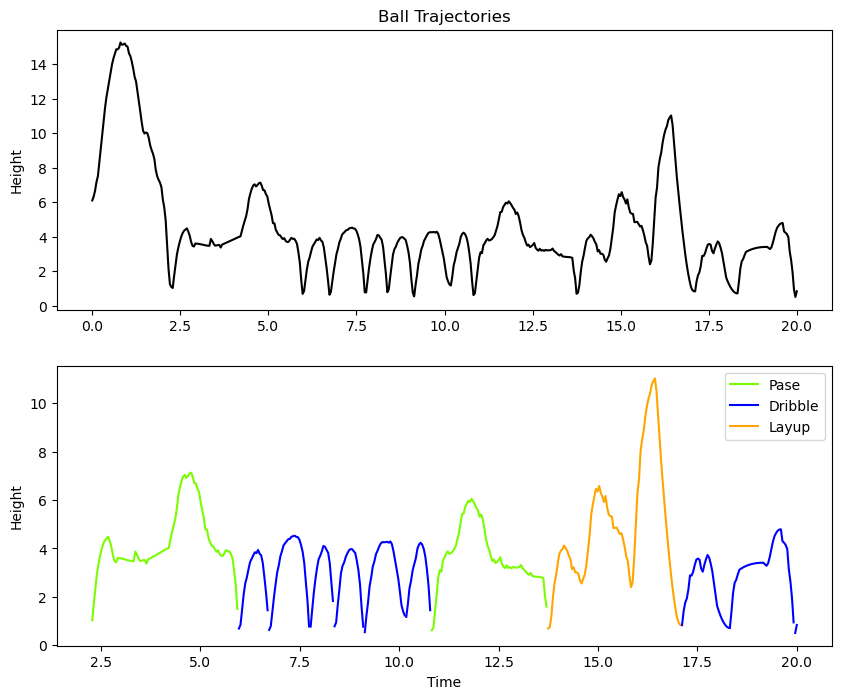

In [1255]:
Colors=['lawngreen','blue','blue','blue','blue','blue','blue','lawngreen','orange','blue','blue','blue']

fig, axs = plt.subplots(2, 1, figsize=(10, 8))
axs[0].plot(np.linspace(0,len(total[146])*0.04,len(total[146])),total[146][:,2],color='black')
for i in range(len(labels)):
    axs[1].plot(grid[i],Particion[i],color=Colors[i],label=tickers[i])
handles, labels = axs[1].get_legend_handles_labels()
by_label = dict(zip(labels, handles))
axs[1].legend(by_label.values(), by_label.keys())
axs[0].set_ylabel('Height')
axs[0].set_title('Ball Trajectories')
axs[1].set_ylabel('Height')
axs[1].set_xlabel('Time')
plt.savefig('fig12.png')
plt.show()

In [1642]:
from matplotlib.animation import FuncAnimation

def dibujo_jugada(data, evento):
    posiciones = extract_positions(data, evento)
    
    
    pelota = posiciones[posiciones['Player_id'] == -1][['x', 'y']].to_numpy()
    
    
    jugadores = {}
    
    for player_id in posiciones['Player_id'].unique():
        if player_id == -1:  
            continue
        jugadores[player_id] = posiciones[posiciones['Player_id'] == player_id][['x', 'y']].to_numpy()

    fig, ax = plt.subplots()
    ax.set_xlim(0, 94)
    ax.set_ylim(0, 50)
    timer_text = ax.text(50, 50, '', fontsize=12, ha='center')


    bola = ax.scatter([], [], s=50, c='orange', marker='o')

    
    player_texts = {
        player_id: ax.text(0, 0, str((i % 5) + 1), fontsize=12, 
                           color='crimson' if i < 5 else 'green') 
        for i, player_id in enumerate(jugadores.keys())
    }

    def update(frame):
        bola.set_offsets(pelota[frame])
        timer_text.set_text(str(frame))

        for player_id, text in player_texts.items():
            if frame < len(jugadores[player_id]):  
                text.set_position(jugadores[player_id][frame])

        return [bola,timer_text] + list(player_texts.values())

    ani = FuncAnimation(fig, update, frames=len(pelota), interval=50, blit=True)
    return HTML(ani.to_jshtml())

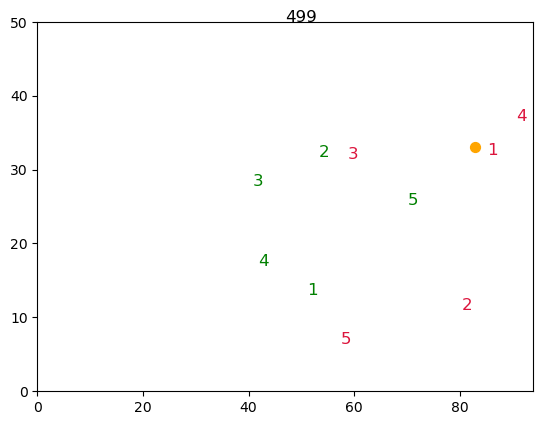

In [1644]:
dibujo_jugada(data,146)

### Validation

Modifying the classifier so I can use it

In [1626]:
def Clasisingle(Pelota):
    Clases=[]
    Jugada=[]
    Colors=[]
    if max(Pelota[:,2])>10:
        if max(Pelota[:,2])>15:
            Clases.append(3)
            Jugada.append('Three')
            Colors.append('crimson')
        else:
            meridio=np.argmax(Pelota[:,2])
            if np.sqrt((Pelota[meridio][0]-5.25)**2+ (Pelota[meridio][1]-25)**2)<np.sqrt(16) or np.sqrt((Pelota[meridio][0]-89.75)**2+ (Pelota[meridio][1]-25)**2)<np.sqrt(16):
                Clases.append(5)
                Jugada.append('Layup')
                Colors.append('orange')
            else:
                Clases.append(4)
                Jugada.append('Middy')
                Colors.append('yellow')
                
    else:
        if len(Pelota[:,2])>=35:
            if len(Pelota[:,2])>60:
                Clases.append(8)
                Jugada.append('Ball Movement')
                Colors.append('cyan')
                    
            else:
                Clases.append(0)
                Jugada.append('Pass')
                Colors.append('lawngreen')
        else:
            Clases.append(7)
            Jugada.append('Dribble')
            Colors.append('blue')
    return Clases,Jugada

In [1044]:
Clasisingle(MuestraPerfecta[3][1])

([3], ['Three'])

In [1046]:
truelabels=[]
for i in range(9):
    truelabels.append([i]*len(MuestraPerfecta[i]))

In [1048]:
truelabels

[[0, 0, 0, 0, 0, 0, 0],
 [],
 [],
 [3, 3, 3, 3, 3, 3, 3, 3, 3, 3, 3],
 [4, 4, 4, 4, 4],
 [5, 5, 5, 5, 5],
 [],
 [7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7, 7],
 [8, 8, 8, 8, 8, 8, 8]]

In [1056]:
truelabels=[elem for arr in truelabels for elem in arr]

In [1136]:
predlabels=[]
for i in range(9):
    for j in range(len(MuestraPerfecta[i])):
        label,a=Clasisingle(MuestraPerfecta[i][j])
        predlabels.append(label)
predlabels=[elem for arr in predlabels for elem in arr]

In [1146]:
predlabelsCBA=[]
for i in range(9):
    for j in range(len(MuestraPerfecta[i])):
        label,a,b=ClasiDBA(MuestraPerfecta[i][j][:,2])
        predlabelsCBA.append(label)

In [1155]:
from sklearn.metrics import confusion_matrix
cfm=confusion_matrix(truelabels,predlabels)
cfm2=confusion_matrix(truelabels,predlabelsCBA)

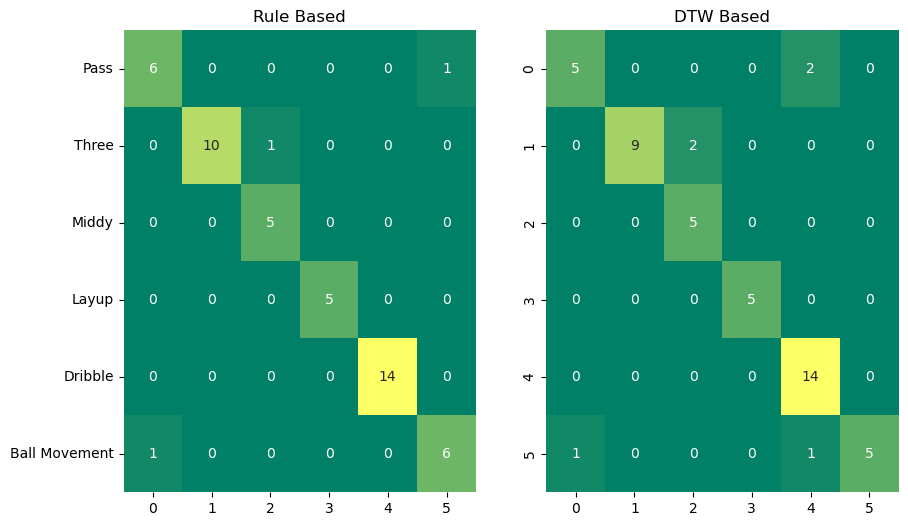

In [1177]:
fig,axs= plt.subplots(1,2,figsize=(10,6))
y_labels=['Pass','Three','Middy','Layup','Dribble','Ball Movement']
sns.heatmap(cfm, annot=True, fmt='d', cmap='summer', cbar=False,ax=axs[0],yticklabels=y_labels)
sns.heatmap(cfm2,annot=True, fmt='d', cmap='summer',cbar=False, ax=axs[1])
axs[0].set_title('Rule Based')
axs[1].set_title('DTW Based')
plt.savefig('fig11.png')
plt.show()

In [1342]:
46/49 , 43/49

(0.9387755102040817, 0.8775510204081632)

In [1306]:
AlturasPerfectas=[[arr[:,2] for arr in clase] for clase in MuestraPerfecta]

In [1328]:
import copy

alltime=[]
for w,aberracion in enumerate(AlturasPerfectas): #Se que es horrible a nivel computacional pero es lo que se me ha ocurrido.
    for z in range(len(aberracion)):
        sample=copy.deepcopy(AlturasPerfectas)
        del sample[w][z]
            
        Centros=[[] for i in range(9)]
        for i in range(9):
            if not AlturasPerfectas[i]:
                Centros[i].append(0)
            else:
                Centros[i].append(dtw_barycenter.dba_loop(sample[i]))
        pred=[]
        for i in range(9):
            for j in range(len(sample[i])):
                label,a,b=ClasiDBA(sample[i][j])
                pred.append(label)
        alltime.append(pred)

In [1344]:
accuracies = []
for i in range(len(truelabels)):
    semi=copy.deepcopy(truelabels)
    del semi[i]
    
    correct=sum(a==b for a,b in zip(alltime[i],semi))
    acc=correct/len(alltime)
    accuracies.append(acc)
    

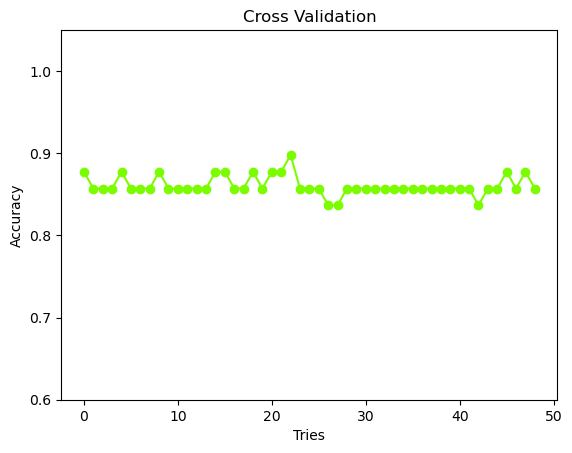

In [1356]:
plt.plot(accuracies, marker='o',color='lawngreen')
plt.title("Cross Validation")
plt.xlabel("Tries")
plt.ylabel("Accuracy")
plt.ylim(0.6, 1.05)
plt.savefig('fig15.png')
plt.show()
            

## Intuitive examples

In [1604]:
x=np.linspace(0,10,20)
prueba1=np.sin(x)
prueba2=np.sin(x-1)
inicial=[0]*15

ayiyi=dtw_barycenter.dba([prueba1,prueba2],inicial)

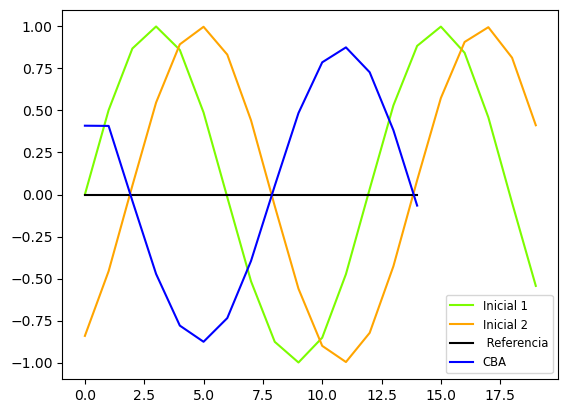

In [1606]:
plt.plot(prueba1,color='lawngreen',label='Inicial 1')
plt.plot(prueba2,color='orange', label='Inicial 2')
plt.plot(inicial,color='black', label=' Referencia')
plt.plot(ayiyi,color='blue', label='CBA')
plt.legend(fontsize='small')
plt.savefig('fig32.png')

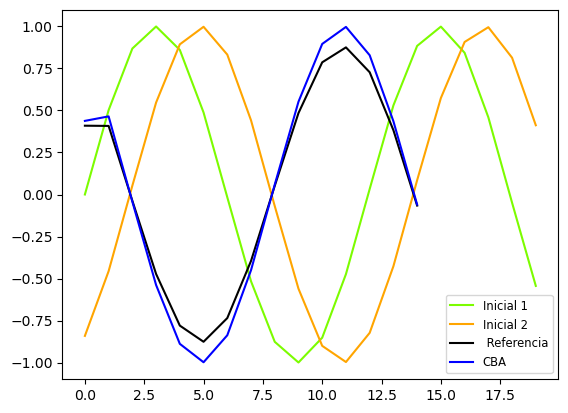

In [1608]:
inicial=ayiyi
ayiyi=dtw_barycenter.dba([prueba1,prueba2],inicial)
plt.plot(prueba1,color='lawngreen',label='Inicial 1')
plt.plot(prueba2,color='orange', label='Inicial 2')
plt.plot(inicial,color='black', label=' Referencia')
plt.plot(ayiyi,color='blue', label='CBA')
plt.legend(fontsize='small')
plt.savefig('fig33.png')

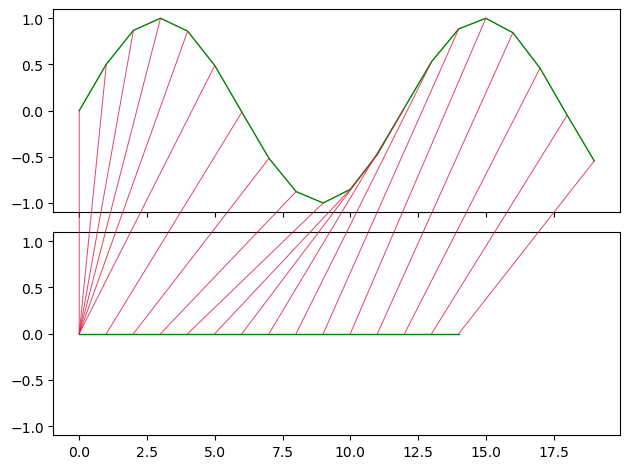

In [1584]:
path = dtw.warping_path(prueba1,inicial)
dtwvis.plot_warping(prueba1, inicial, path,series_line_options={'linewidth': 1, 'color': 'green', 'alpha': 1},warping_line_options={'linewidth': 0.7, 'color': 'crimson', 'alpha': 0.8})
plt.savefig('fig30.png')

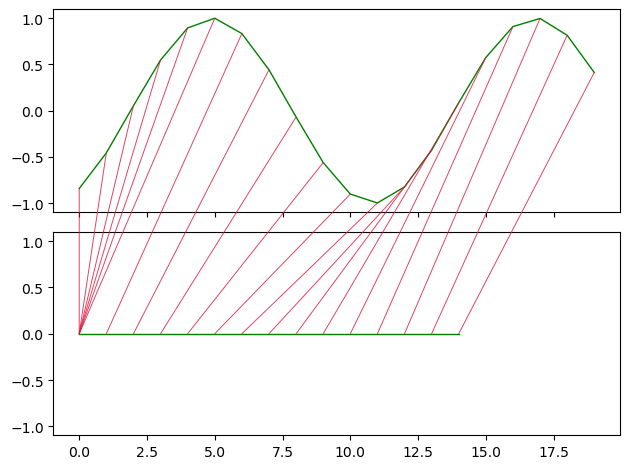

In [1586]:
path = dtw.warping_path(prueba2,inicial)
dtwvis.plot_warping(prueba2, inicial, path,series_line_options={'linewidth': 1, 'color': 'green', 'alpha': 1},warping_line_options={'linewidth': 0.7, 'color': 'crimson', 'alpha': 0.8})
plt.savefig('fig31.png')